In [136]:
#IMPORTING LIBRARIES
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import StackingClassifier
from sklearn.impute import SimpleImputer
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV

from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score, recall_score, roc_curve, auc, precision_score
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn import metrics
from sklearn.metrics import f1_score, classification_report
#SkLearn ML ALGORITHMS
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn import svm
from sklearn.neural_network import MLPClassifier

import warnings
warnings.filterwarnings("ignore")

In [65]:
#LOADING DATASET
df = pd.read_csv('C:\\Users\\KIIT\\Downloads\\train.csv')
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [117]:
print(df[0:5])

   battery_power  blue  clock_speed  dual_sim  fc  four_g  int_memory  m_dep  \
0            842     0          2.2         0   1       0           7    0.6   
1           1021     1          0.5         1   0       1          53    0.7   
2            563     1          0.5         1   2       1          41    0.9   
3            615     1          2.5         0   0       0          10    0.8   
4           1821     1          1.2         0  13       1          44    0.6   

   mobile_wt  n_cores  ...  px_height  px_width   ram  sc_h  sc_w  talk_time  \
0        188        2  ...       20.0       756  2549     9   7.0         19   
1        136        3  ...      905.0      1988  2631    17   3.0          7   
2        145        5  ...     1263.0      1716  2603    11   2.0          9   
3        131        6  ...     1216.0      1786  2769    16   8.0         11   
4        141        2  ...     1208.0      1212  1411     8   2.0         15   

   three_g  touch_screen  wifi  price_

In [3]:
df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [4]:
len(df.columns)

21

In [66]:
#USED THIS FUNCTION TO GET THE LAST N NUMBER OF ROWS
df.tail

<bound method NDFrame.tail of       battery_power  blue  clock_speed  dual_sim  fc  four_g  int_memory  \
0               842     0          2.2         0   1       0           7   
1              1021     1          0.5         1   0       1          53   
2               563     1          0.5         1   2       1          41   
3               615     1          2.5         0   0       0          10   
4              1821     1          1.2         0  13       1          44   
...             ...   ...          ...       ...  ..     ...         ...   
1995            794     1          0.5         1   0       1           2   
1996           1965     1          2.6         1   0       0          39   
1997           1911     0          0.9         1   1       1          36   
1998           1512     0          0.9         0   4       1          46   
1999            510     1          2.0         1   5       1          45   

      m_dep  mobile_wt  n_cores  ...  px_height  px_width

## Data Analysis

In [68]:
#GATHERING INFORMATION OF DATA
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [69]:
#GETTING DESCRIPTION OF DATA
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [71]:
#GETTING THE TRANSPOSE OF THE DATA
df.describe().T

,count,mean,std,min,25%,50%,75%,max
battery_power,2000.0,1238.51850,439.418206,501.0,851.75,1226.0,1615.25,1998.0
blue,2000.0,0.49500,0.500100,0.0,0.00,0.0,1.00,1.0
clock_speed,2000.0,1.52225,0.816004,0.5,0.70,1.5,2.20,3.0
dual_sim,2000.0,0.50950,0.500035,0.0,0.00,1.0,1.00,1.0
fc,2000.0,4.30950,4.341444,0.0,1.00,3.0,7.00,19.0
four_g,2000.0,0.52150,0.499662,0.0,0.00,1.0,1.00,1.0
int_memory,2000.0,32.04650,18.145715,2.0,16.00,32.0,48.00,64.0
m_dep,2000.0,0.50175,0.288416,0.1,0.20,0.5,0.80,1.0
mobile_wt,2000.0,140.24900,35.399655,80.0,109.00,141.0,170.00,200.0
n_cores,2000.0,4.52050,2.287837,1.0,3.00,4.0,7.00,8.0


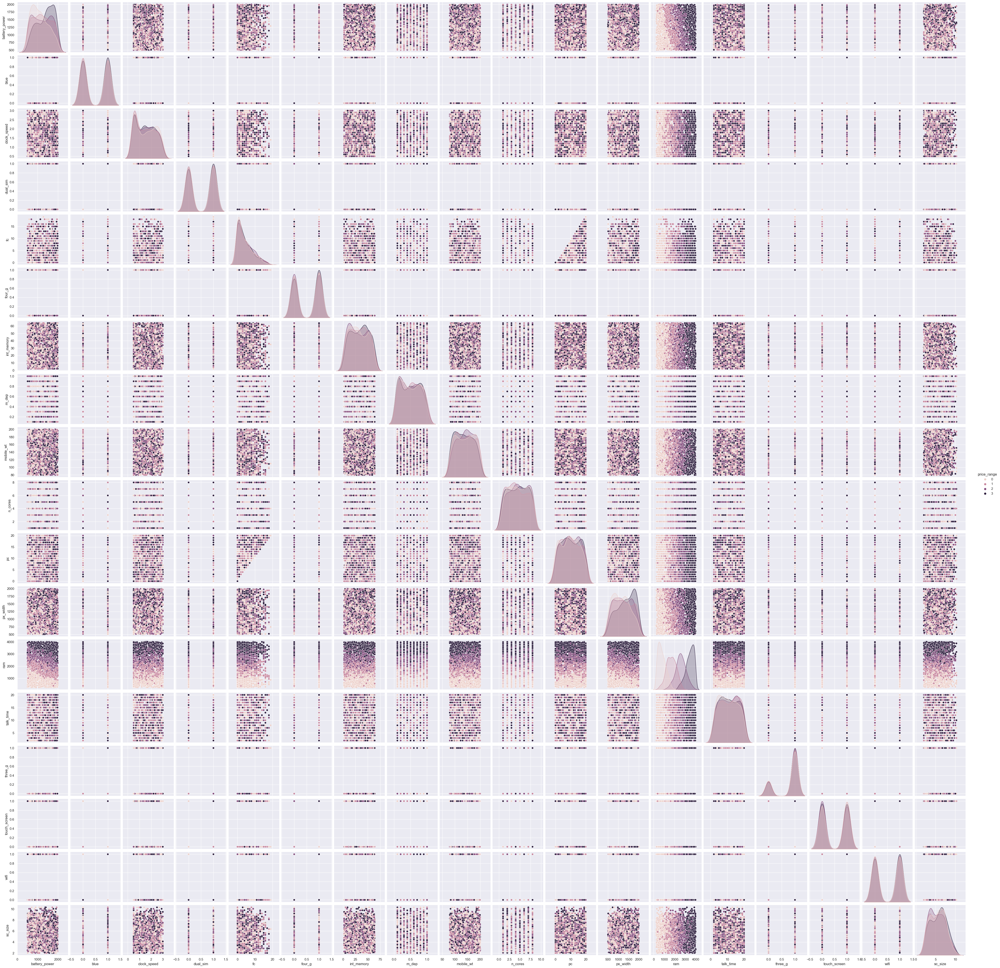

In [62]:
sns.pairplot(df,hue='price_range')

<Axes: xlabel='price_range', ylabel='int_memory'>

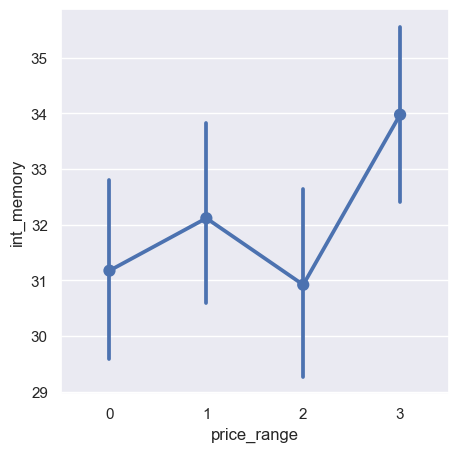

In [90]:
sns.pointplot(y="int_memory", x="price_range", data=df)

<Axes: xlabel='price_range', ylabel='talk_time'>

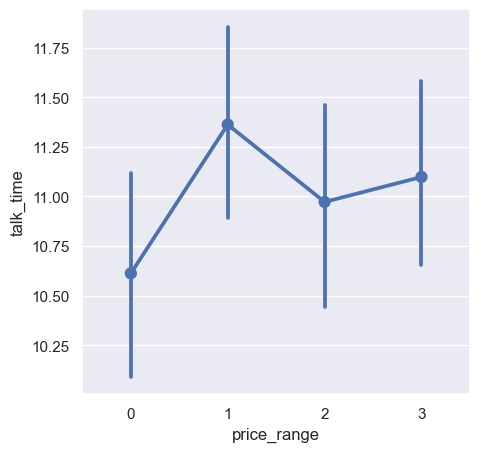

In [94]:
sns.pointplot(y="talk_time", x="price_range", data=df)

Text(0.5, 0, 'MegaPixels')

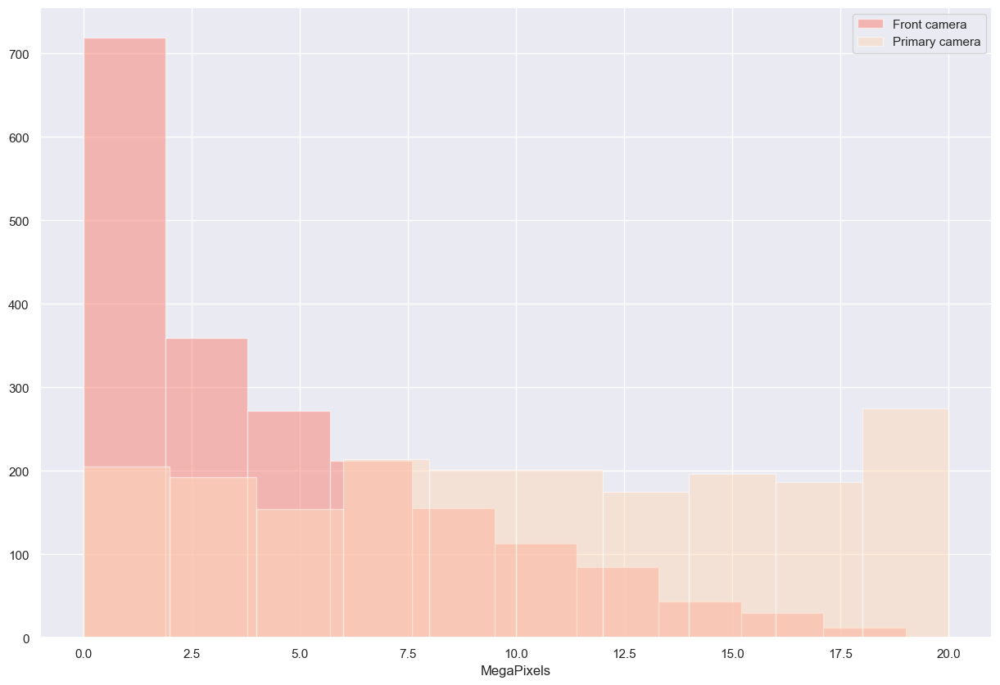

In [93]:
plt.figure(figsize=(15,10))
df['fc'].hist(alpha=0.5,color='salmon',label='Front camera')
df['pc'].hist(alpha=0.5,color='peachpuff',label='Primary camera')
plt.legend()
plt.xlabel('MegaPixels')

In [73]:
#TOTAL PHONES WITH SC_W = 0
print(len(df[df.sc_w == 0]))
#TOTAL PHONES WITH PX_HEIGHT = 0
print(len(df[df.px_height == 0]))
#TOTAL PHONES WITH SC_H = 0
print(len(df[df.sc_h == 0]))

180
2
0


In [75]:
#THERE IS SC_W, SC_H AND PX_HEIGHT IS ZERO
df['sc_w'][df[df.sc_w == 0].index] = df.sc_w.mean()
df['px_height'][df[df.px_height == 0].index] = df.px_height.mean()

In [77]:
#CHECKING WHETHER THERE IS DUPLICATES OR NOT
#THERE ARE ACTUALLY NO DUPLICATE VALUES
len(df[df.duplicated()])

0

In [78]:
#THIS METHOD RETURNS THE NUMBER OF UNIQUE VALUES FOR EACH COLUMNS
df.nunique()

battery_power    1094
blue                2
clock_speed        26
dual_sim            2
fc                 20
four_g              2
int_memory         63
m_dep              10
mobile_wt         121
n_cores             8
pc                 21
px_height        1137
px_width         1109
ram              1562
sc_h               15
sc_w               19
talk_time          19
three_g             2
touch_screen        2
wifi                2
price_range         4
dtype: int64

In [80]:
#CHECKING WHETHER THERE IS NULL VALUES OR NOT
#HERE WE GET TO KNOW THAT THERE ARE NO MISSING VALUES IN THE DATASET
df.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

## Exploratory Data Analysis

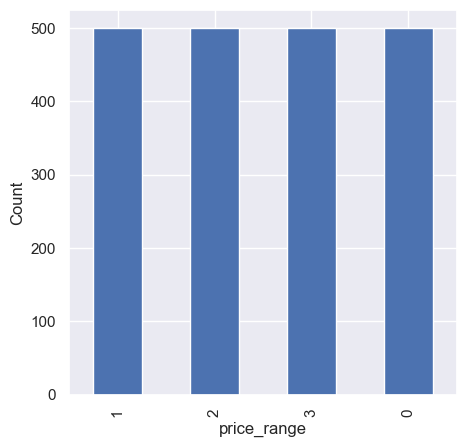

In [83]:
#CLASSES | PRICES
#THERE ARE MOBILE PHONES IN 4 PRICES RANGES
#THERE NUMBER OF ELEMENTS IS ALMOST SIMILAR
sns.set()
price_plot=df['price_range'].value_counts().plot(kind='bar')
plt.xlabel('price_range')
plt.ylabel('Count')
plt.show()

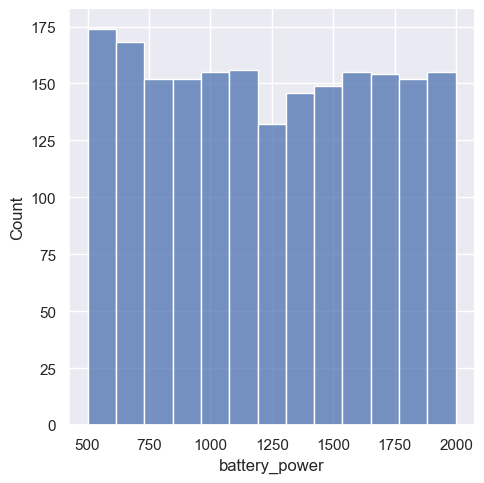

In [86]:
#PLOT FOR BATTERY POWER
#TO SEE HOW THE BATTERY mAh IS SPREAD
#THERE IS A GRADUAL INCREASE AS THE PRICE RANGE INCREASES
sns.set(rc={'figure.figsize':(5,5)})
ax=sns.displot(df["battery_power"])
plt.show()

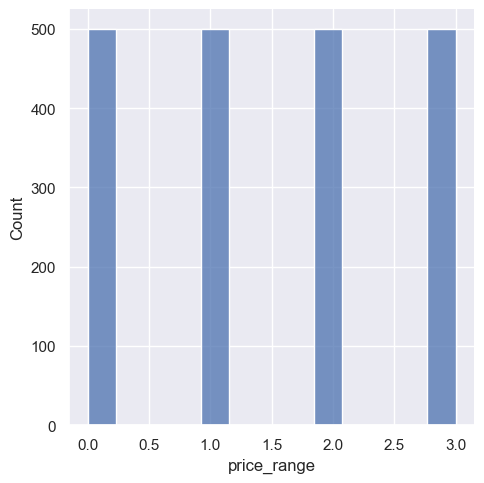

In [20]:
sns.set(rc={'figure.figsize':(5,5)})
ax=sns.displot(df["price_range"])
plt.show()

<Axes: xlabel='blue', ylabel='price_range'>

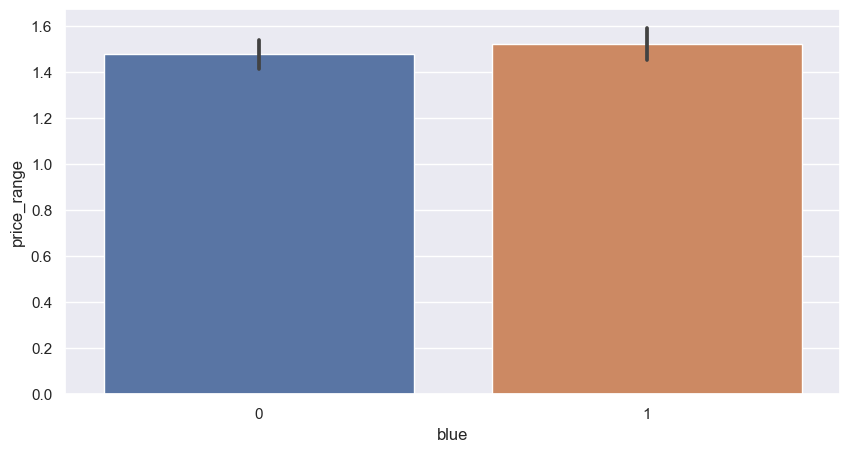

In [87]:
#ANALYSIS OF DATA BY VISUALISATION
#DIVIDED AMOUNT OF THE DEVICES HAVE BLUETOOTH
fig,ax=plt.subplots(figsize=(10,5))
sns.barplot(data=df,x='blue',y='price_range',ax=ax)

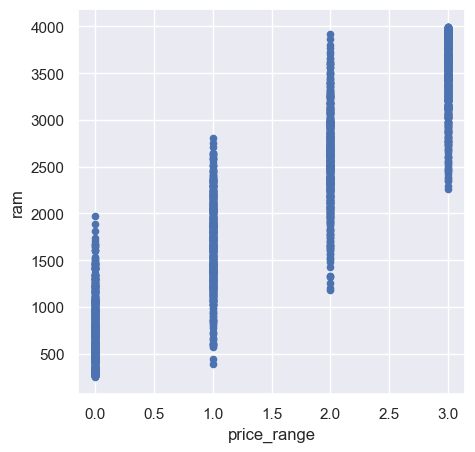

In [88]:
#RAM IS SEEN IWTH CONTINUOUS INCREASE WITH PRICE RANGE WHILE MOVINF FROM LOW COST TO VERY HIGH COST
df.plot(x='price_range',y='ram',kind='scatter')
plt.show()

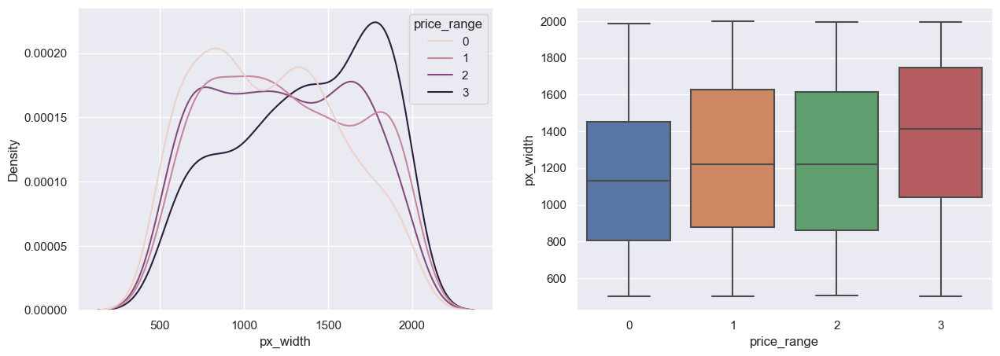

In [89]:
#NO CONTINUOUS INCREASE IN PIXEL WIDTH AS WE MOVE FROM LOW COST TO VERY HIGH COST.
#EQUAL PIXEL WIDTH | MOBILES WITH 'MEDIUM COST' & 'HIGH COST'
fig, axs = plt.subplots(1,2, figsize=(15,5))
sns.kdeplot(data=df, x='px_width', hue='price_range', ax=axs[0])
sns.boxplot(data=df, x='price_range', y='px_width', ax=axs[1])
plt.show()

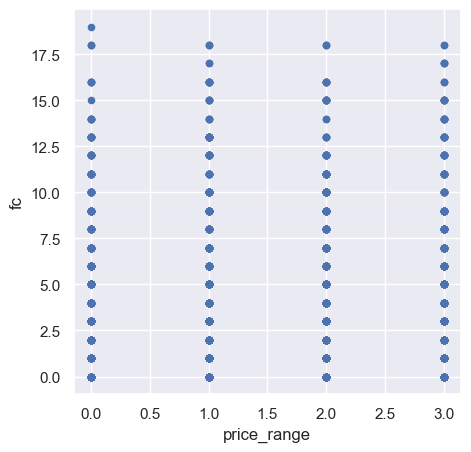

In [25]:
df.plot(x='price_range',y='fc',kind='scatter')
plt.show()

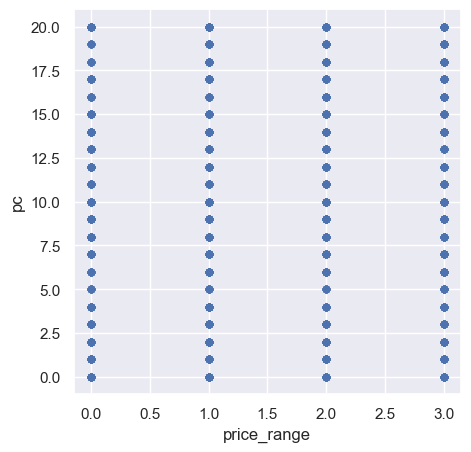

In [26]:
df.plot(x='price_range',y='pc',kind='scatter')
plt.show()

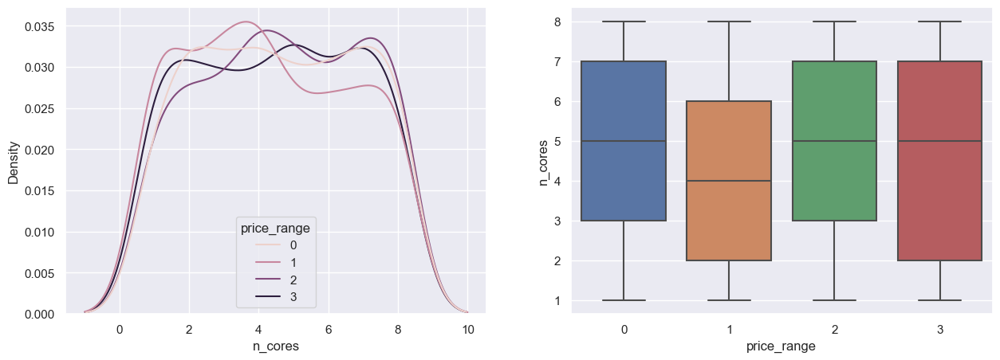

In [27]:
fig, axs = plt.subplots(1,2, figsize=(15,5))
sns.kdeplot(data=df, x='n_cores', hue='price_range', ax=axs[0])
sns.boxplot(data=df, x='price_range', y='n_cores', ax=axs[1])
plt.show()

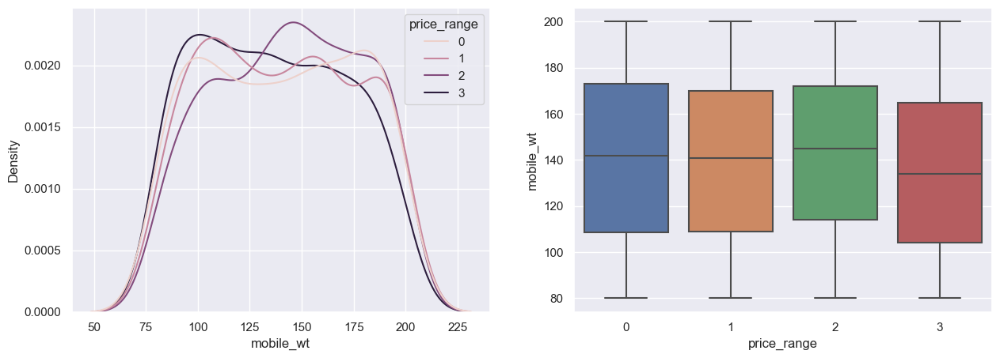

In [28]:
fig, axs = plt.subplots(1,2, figsize=(15,5))
sns.kdeplot(data=df, x='mobile_wt', hue='price_range', ax=axs[0])
sns.boxplot(data=df, x='price_range', y='mobile_wt', ax=axs[1])
plt.show()

In [29]:
df['sc_size'] = np.sqrt((df['sc_h']**2) + (df['sc_w']**2))
df['sc_size'] = round(df['sc_size']/2.54, 2)

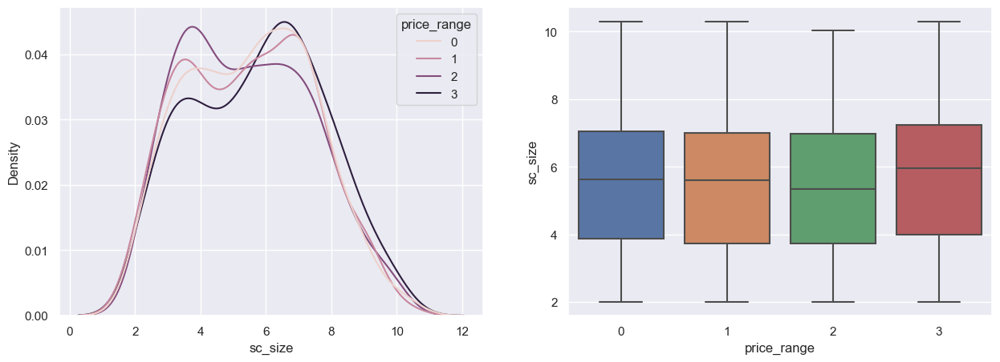

In [30]:
fig, axs = plt.subplots(1,2, figsize=(15,5))
sns.kdeplot(data=df, x='sc_size', hue='price_range', ax=axs[0])
sns.boxplot(data=df, x='price_range', y='sc_size', ax=axs[1])
plt.show()

In [31]:
df.drop(['sc_h', 'sc_w'], axis = 1, inplace = True)

In [32]:
binary_features = [ 'four_g', 'three_g']

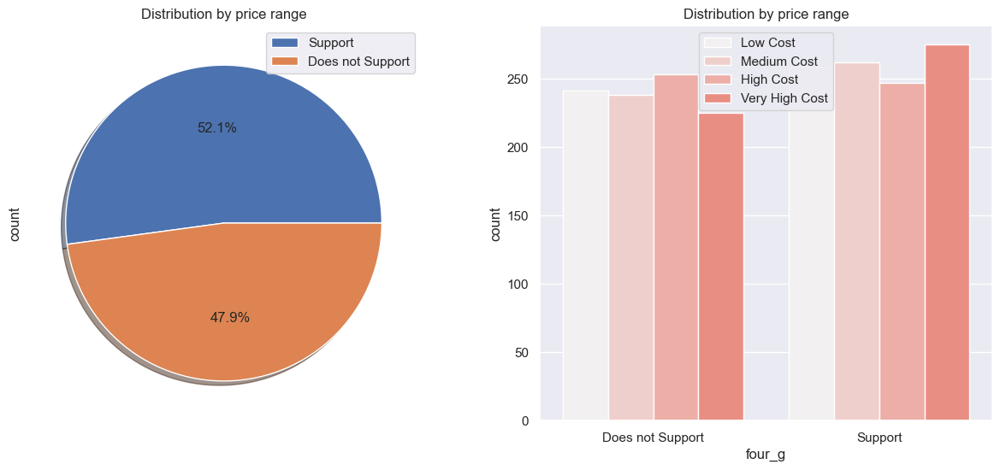

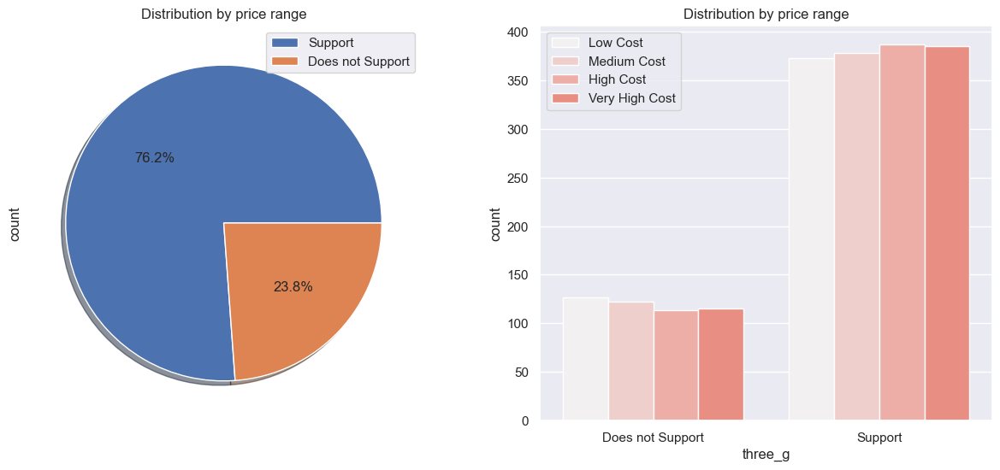

In [34]:
for col in binary_features:
  fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (15, 6))

  df[col].value_counts().plot.pie (autopct='%1.1f%%', ax = ax1, shadow=True, labeldistance=None)
  ax1.set_title('Distribution by price range')
  ax1.legend(['Support', 'Does not Support'])
  sns.countplot(x = col, hue = 'price_range', data = df, ax = ax2, color = 'salmon')
  ax2.set_title('Distribution by price range')
  ax2.set_xlabel(col)
  ax2.legend(['Low Cost', 'Medium Cost', 'High Cost', 'Very High Cost'])
  ax2.set_xticklabels(['Does not Support', 'Support'])


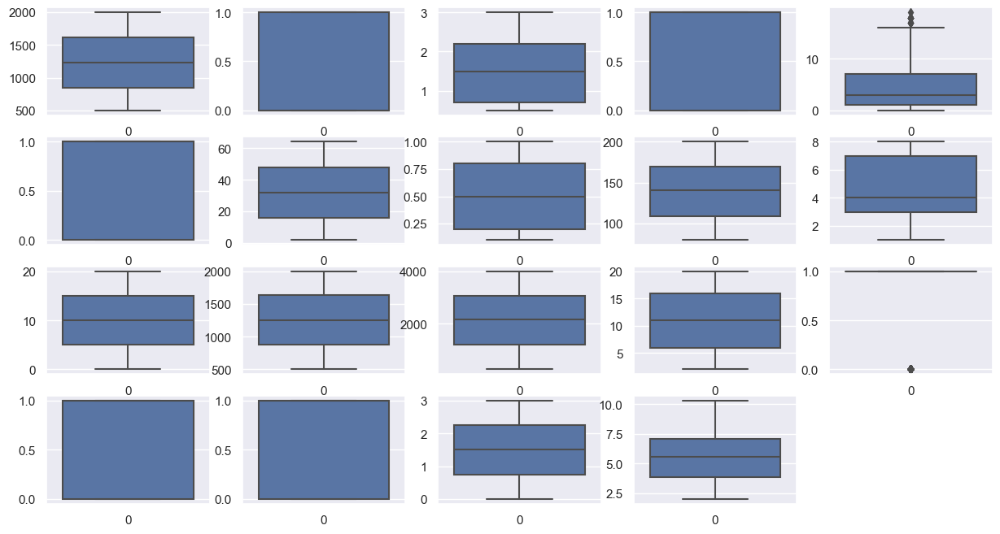

In [38]:
plt.figure(figsize=(15,10))
for index,item in enumerate([i for i in df.describe().columns.to_list()] ):
  plt.subplot(5,5,index+1)
  sns.boxplot(df[item])
print("\n")

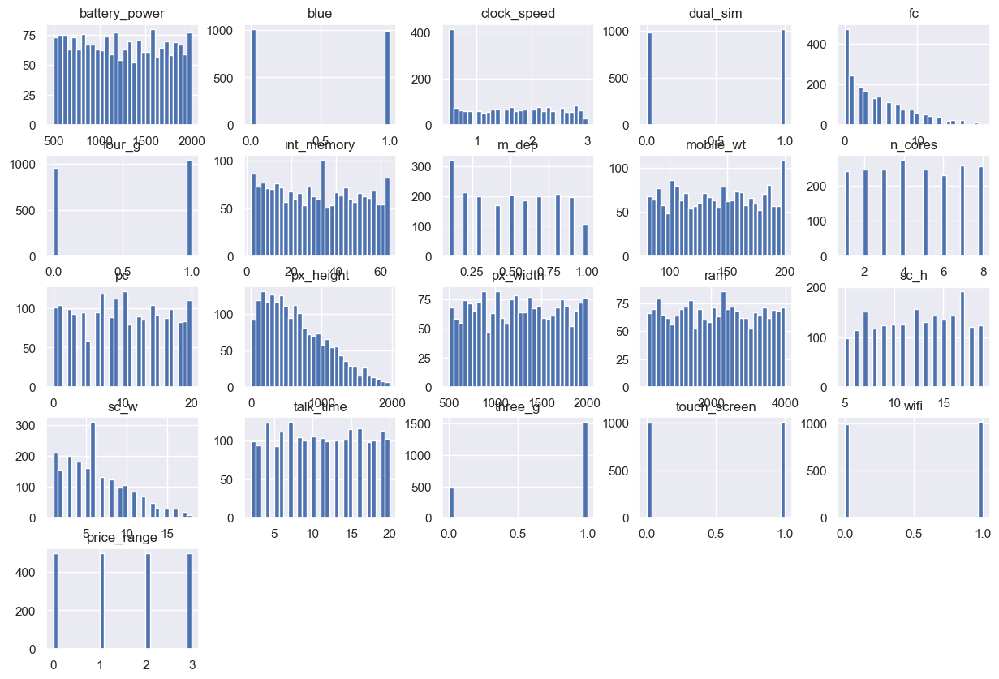

In [122]:
df.hist(bins = 30, figsize = (15,10))
plt.show()

In [123]:
corr = df.corr()
corr.method = 'pearson'
corr.style.background_gradient(cmap='Greys')

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
battery_power,1.000000,0.011252,0.011482,-0.041847,0.033334,0.015665,-0.004004,0.034085,0.001844,-0.029727,0.031441,0.015337,-0.008402,-0.000653,-0.029959,-0.021508,0.052510,0.011522,-0.010516,-0.008343,0.200723
blue,0.011252,1.000000,0.021419,0.035198,0.003593,0.013443,0.041177,0.004049,-0.008605,0.036161,-0.009952,-0.006865,-0.041533,0.026351,-0.002952,-0.022756,0.013934,-0.030236,0.010061,-0.021863,0.020573
clock_speed,0.011482,0.021419,1.000000,-0.001315,-0.000434,-0.043073,0.006545,-0.014364,0.012350,-0.005724,-0.005245,-0.013597,-0.009476,0.003443,-0.029078,-0.003921,-0.011432,-0.046433,0.019756,-0.024471,-0.006606
dual_sim,-0.041847,0.035198,-0.001315,1.000000,-0.029123,0.003187,-0.015679,-0.022142,-0.008979,-0.024658,-0.017143,-0.022381,0.014291,0.041072,-0.011949,-0.004794,-0.039404,-0.014008,-0.017117,0.022740,0.017444
fc,0.033334,0.003593,-0.000434,-0.029123,1.000000,-0.016560,-0.029133,-0.001791,0.023618,-0.013356,0.644595,-0.009769,-0.005176,0.015099,-0.011014,-0.016566,-0.006829,0.001793,-0.014828,0.020085,0.021998
four_g,0.015665,0.013443,-0.043073,0.003187,-0.016560,1.000000,0.008690,-0.001823,-0.016537,-0.029706,-0.005598,-0.017862,0.007448,0.007313,0.027166,0.032117,-0.046628,0.584246,0.016758,-0.017620,0.014772
int_memory,-0.004004,0.041177,0.006545,-0.015679,-0.029133,0.008690,1.000000,0.006886,-0.034214,-0.028310,-0.033273,0.009566,-0.008335,0.032813,0.037771,0.006099,-0.002790,-0.009366,-0.026999,0.006993,0.044435
m_dep,0.034085,0.004049,-0.014364,-0.022142,-0.001791,-0.001823,0.006886,1.000000,0.021756,-0.003504,0.026282,0.024524,0.023566,-0.009434,-0.025348,-0.011666,0.017003,-0.012065,-0.002638,-0.028353,0.000853
mobile_wt,0.001844,-0.008605,0.012350,-0.008979,0.023618,-0.016537,-0.034214,0.021756,1.000000,-0.018989,0.018844,0.000375,0.000090,-0.002581,-0.033855,-0.035414,0.006209,0.001551,-0.014368,-0.000409,-0.030302
n_cores,-0.029727,0.036161,-0.005724,-0.024658,-0.013356,-0.029706,-0.028310,-0.003504,-0.018989,1.000000,-0.001193,-0.005938,0.024480,0.004868,-0.000315,0.021165,0.013148,-0.014733,0.023774,-0.009964,0.004399


In [124]:
def scale_dataset(dataframe, oversample=False):
    x = dataframe[dataframe.columns[:-1]].values
    y = dataframe[dataframe.columns[-1]].values
    
    scaler = MinMaxScaler()
    x = scaler.fit_transform(x)
    
    
    if oversample:
        ros = RandomOverSampler()
        x,y = ros.fit_resample(x,y)
    
    data = np.hstack((x,np.reshape(y,(-1,1))))
                     
    return data, x,y

In [126]:
scaled,x,y = scale_dataset(df, oversample=False)

In [132]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=13)

In [140]:
classifiers = {
    "C_LR":    LogisticRegression(max_iter=1000, solver='newton-cg'),
    "C_KNN":   KNeighborsClassifier(n_neighbors = 5),
    "C_DT":    DecisionTreeClassifier(max_depth=8),
    "C_RF":    RandomForestClassifier(max_depth = 5, n_estimators =10, max_features=1),
    "C_ANN":   MLPClassifier(alpha = 0.01, max_iter=10000, hidden_layer_sizes=[20, 10, 4], activation = 'logistic', solver='adam')
}
results = {}
print("NUMBER OF MISLABELED POINTS OUT OF A TOTAL %d POINTS:" % x_test.shape[0])
#TRAIN THE CLASSIFIERS ON TRAINING SET Train the classifiers on the training set and test classifiers on unseen test data
for clf_name, clf_model in classifiers.items():
    clf_model.fit(x_train, y_train)
    print(clf_name + ": %d" % (y_test != clf_model.predict(x_test)).sum())
    results[clf_name] = clf_model.predict(x_test)

NUMBER OF MISLABELED POINTS OUT OF A TOTAL 400 POINTS:
C_LR: 36
C_KNN: 248
C_DT: 76
C_RF: 180
C_ANN: 16


In [141]:
print("MODEL PERFORMANCE SCORES: ")
for clf_name, clf_model in results.items():
    
    print(clf_name + ":", classification_report(y_test, results[clf_name]))

MODEL PERFORMANCE SCORES: 
C_LR:               precision    recall  f1-score   support

           0       0.91      0.94      0.92        96
           1       0.88      0.85      0.87       107
           2       0.89      0.88      0.89        95
           3       0.95      0.97      0.96       102

    accuracy                           0.91       400
   macro avg       0.91      0.91      0.91       400
weighted avg       0.91      0.91      0.91       400

C_KNN:               precision    recall  f1-score   support

           0       0.45      0.54      0.49        96
           1       0.31      0.34      0.32       107
           2       0.24      0.27      0.25        95
           3       0.63      0.37      0.47       102

    accuracy                           0.38       400
   macro avg       0.41      0.38      0.38       400
weighted avg       0.41      0.38      0.38       400

C_DT:               precision    recall  f1-score   support

           0       0.86      

C_LR:


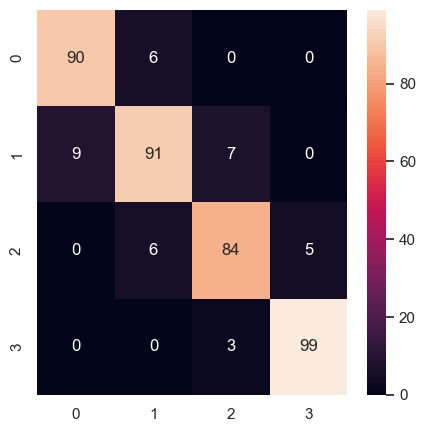

C_KNN:


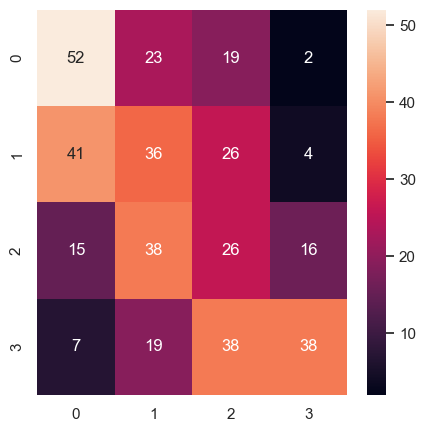

C_DT:


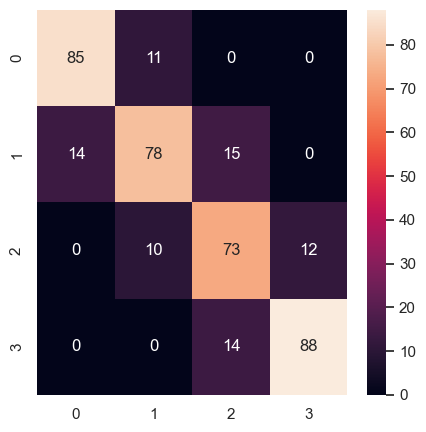

C_RF:


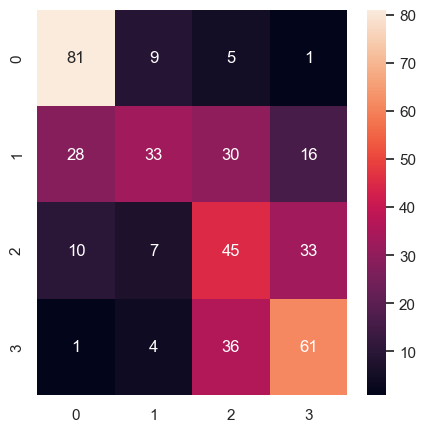

C_ANN:


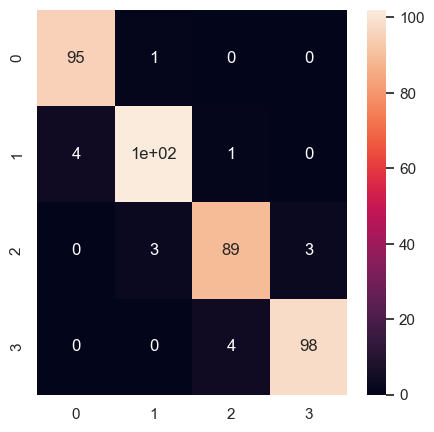

In [144]:
from sklearn.metrics import ConfusionMatrixDisplay
import seaborn as sns

#PERFORMANCE ON SCALED DATA WITH ANN MODEL WITH AN ACCURACY OF 96%
#USING MINMAXSCALER()METHOD
for clf_name, clf_model in classifiers.items():
    categories = ['C 0', 'C 1', 'C 2', 'C 3']
    print(clf_name + ":")
    cf_matrix = confusion_matrix(y_test,clf_model.predict(x_test) )
    sns.heatmap(cf_matrix, annot=True)
    plt.show()